# Assignment 8 - Answer

In [1]:
import numpy as np
import matplotlib.pyplot as plt

from sklearn import cluster, datasets, mixture
from sklearn.preprocessing import StandardScaler

1. 
Attempt to compare different clustering algorithms based on how they cluster, as well as time.
- K-means
- Spectral clustering
- Mini-Batch K-means
- Gaussian mixture
- DBSCAN - although I did not teach you, it is simply a density-based that treats nearby instance as neighbors. It has
two parameters (eps, min-points) that define the distance to considered as neighbors.

Attempt to play around with different parameters of each model.
Last but probably the most important, interpret the result (why
this algorithm works well or otherwise)

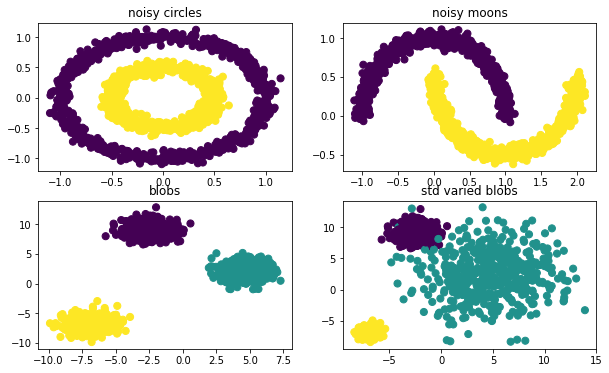

In [2]:
def plot_clusters(ax, datasets, title):
    X, y = datasets
    ax.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='viridis')
    ax.set_title(title)

n_samples = 1500
fig, ax = plt.subplots(2, 2, figsize=(10, 6))

#noisy_circles
noisy_circles = datasets.make_circles(n_samples=n_samples, factor=.5,
                                      noise=.05)
#noisy_moons
noisy_moons = datasets.make_moons(n_samples=n_samples, noise=.05)

#normal blobs
blobs = datasets.make_blobs(n_samples=n_samples, random_state=42)

#std varied blobs
varied = datasets.make_blobs(n_samples=n_samples,
                             cluster_std=[1.0, 3.5, 0.5],
                            random_state=42)

datasets = [noisy_circles, noisy_moons, blobs, varied]
title = ['noisy circles', 'noisy moons', 
         'blobs', 'std varied blobs']
for i, axi in enumerate(ax.flat):
    plot_clusters(axi, datasets[i], title[i])

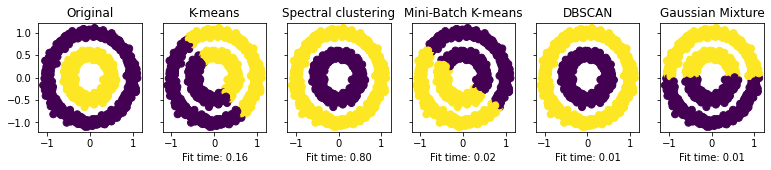

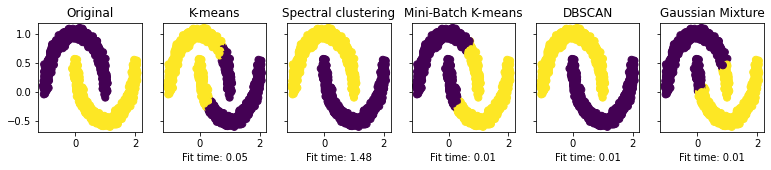

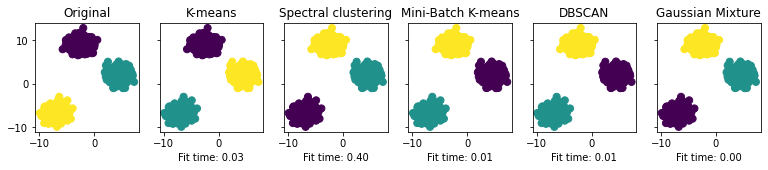

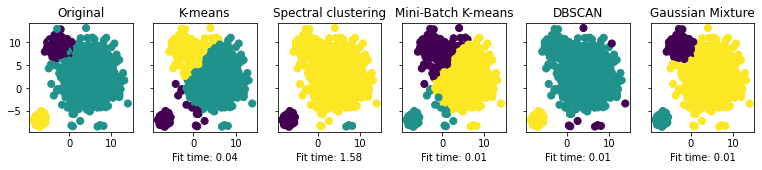

In [3]:
# Your code here

import numpy as np
import matplotlib.pyplot as plt

from sklearn import cluster, datasets, mixture
from sklearn.preprocessing import StandardScaler

from time import time

#Attempt to compare different clustering algorithms 
#Based on how they cluster, as well as time
#-K-means
#-Spectral clustering
#-Mini-Batch K-means
#-Gaussian mixture
#-DBSCAN - although I did not teach you, it is simply a density-based
#that treats nearby instance as neighbors.  Definitely it has
#two parameters that define "what" proximity is considered neighbors
#here is the data

def plot_clusters(X, y, preds, models, fit_times, title):
    fig, ax = plt.subplots(1, 6, figsize=(13, 2), sharey=True)
    ax[0].scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='viridis')
    ax[0].set_title("Original")
    for i, axi in enumerate(ax.flat[1:]):
        axi.scatter(X[:, 0], X[:, 1], c=preds[i], s=50, cmap='viridis')
        axi.set_xlabel(f"Fit time: {fit_times[i]:.2f}")
        axi.set_title(list(models.keys())[i])

n_samples = 1500

#noisy_circles
noisy_circles = datasets.make_circles(n_samples=n_samples, factor=.5,
                                      noise=.05)
#noisy_moons
noisy_moons = datasets.make_moons(n_samples=n_samples, noise=.05)

#normal blobs
blobs = datasets.make_blobs(n_samples=n_samples, random_state=42)

#std varied blobs
varied = datasets.make_blobs(n_samples=n_samples,
                             cluster_std=[1.0, 3.5, 0.5],
                            random_state=42)

datasets = [noisy_circles, noisy_moons, blobs, varied]
title = ['noisy circles', 'noisy moons', 
         'blobs', 'std varied blobs']

#defining the models for noisy circle and noisy moon
kmeans = cluster.KMeans(n_clusters=2)
#by default, it uses rbf, but nearest neighbors work well if things are geometrically clustered
spectral = cluster.SpectralClustering(n_clusters = 2, affinity="nearest_neighbors")
mini_batch_kmeans = cluster.MiniBatchKMeans(n_clusters=2)
#eps define the distance considered as neighbors.  
#thus higher the values, the farther samples are considered as same clusters
#I found that if I put value more than .2, it will consider
#the inner and outer circle as same cluster
dbscan = cluster.DBSCAN(eps = .2)
gmm = mixture.GaussianMixture(n_components = 2)

models = {
    "K-means": kmeans,
    "Spectral clustering": spectral,
    "Mini-Batch K-means": mini_batch_kmeans,
    "DBSCAN": dbscan,
    "Gaussian Mixture": gmm
}

for ix, dataset in enumerate(datasets[:2]):
    X, y = dataset
    dataset_name = title[ix]
    preds = []
    fit_times = []
    for ix, (name, model) in enumerate(models.items()):
        start = time()
        model.fit(X)
        fit_times.append(time() - start)
        #for spectral clustering which has no "predict" func
        if hasattr(model, 'labels_'):
            preds.append(model.labels_)
        else:
            preds.append(model.predict(X))
    plot_clusters(X, y, preds, models, fit_times, dataset_name)
    

#defining the models for blobs
kmeans = cluster.KMeans(n_clusters=3)
spectral = cluster.SpectralClustering(n_clusters = 3)
mini_batch_kmeans = cluster.MiniBatchKMeans(n_clusters=3)

#set eps to be very high, so it can consume the whole cluster
#probably one of the biggest critic of DBSCAN is to
#choose the right eps....especially when you cannot visualize!
#perhaps using the same elbow method may work
dbscan = cluster.DBSCAN(eps = 2)
gmm = mixture.GaussianMixture(n_components = 3)

models = {
    "K-means": kmeans,
    "Spectral clustering": spectral,
    "Mini-Batch K-means": mini_batch_kmeans,
    "DBSCAN": dbscan,
    "Gaussian Mixture": gmm
}

for ix, dataset in enumerate(datasets[2:]):
    X, y = dataset
    dataset_name = title[ix]
    preds = []
    fit_times = []
    for ix, (name, model) in enumerate(models.items()):
        start = time()
        model.fit(X)
        fit_times.append(time() - start)
        #for spectral clustering which has no "predict" func
        if hasattr(model, 'labels_'):
            preds.append(model.labels_)
        else:
            preds.append(model.predict(X))
    plot_clusters(X, y, preds, models, fit_times, dataset_name)

### Interpretation

I think the first lesson learned is that there are really no one best algorithms.  Each has its own place.  Some comments:

- **K-means** perform only well in equal-sized blobs.  It is also important to note that most data in real-world is rarely a equal-sized blobs, thus k-means can be at most a good baseline algorithms for clustering
- **Mini-Batch K-means** is simply a much faster variant of K-means, thus there is NO reason at all to use K-means
- Note that **Spectral clustering** support many kernels. By default it uses rbf.  For moons and circles, it makes more sense to use nearest neighbors as geodesic distance will work much better than euclidean distances.   One big big drawback of spectral clustering is its fit time!  It's almost 50 times slower than other algorithms!
- **DBSCA**N shines when cluster are continous, such as the moon or the two circles.  On the other hand, it fails terribly on last case, since it consider any nearby neighbors within eps distance to be the same cluster.  Perhaps adjusting eps would give better result - but that's another drawback!  Deciding the right eps is not easy given there is really no one metric to decide the goodness-of-fit for clustering
- **Gaussian mixture** is a gaussian-based distribution algorithm and surprisinly is the only one algorithm able to beat the last dataset.  But of course, since it's gaussian, it remains a spherical/eclipse shape and when we give only 2 components, it is like overlaying two eclipse and thus fail terribly on the first two datasets.

2. Implement K-means from scratch. Should be pretty simple

    1. Randomly choose n clusters from X
    2. Assign lables based on closest center
    3. find new centers using the mean of each class samples
    4. Repeat until centers do not change anymore
    5. To predict, simply use the function you have defined in #3

For every iteration, plot the centers and the colors of each sample

Done in 14 iterations
Fit and predict time: 0.04232978820800781


Text(0.5, 1.0, 'Final result')

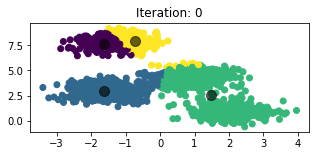

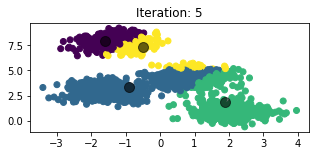

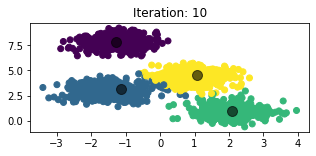

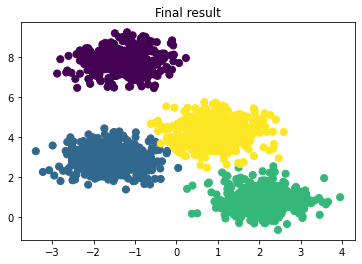

In [4]:
# Your code here

#Implement K-means from scratch
from sklearn.datasets import make_blobs
from sklearn.metrics import pairwise_distances_argmin

X, y_true = make_blobs(n_samples=1500, centers=4,
                       cluster_std=0.60, random_state=0)

def kmeans(X, n_clusters):
    n_samples, n_features = X.shape

    #1. randomly choose n clusters from X
    #you can also randomly generate any two points
    rng = np.random.RandomState(42)
    i = rng.permutation(X.shape[0])[:n_clusters]
    centers = X[i]

    iteration = 0

    while True:
        #2. assign lables based on closest center
        #return the index of centers having smallest
        #distance with X
        labels = pairwise_distances_argmin(X, centers)

        #3. find new centers
        new_centers = []
        for i in range(n_clusters):
            new_centers.append(X[labels == i].mean(axis=0))

        #convert list to np.array; you can actually combine #3
        #with np.array in one sentence 
        new_centers = np.array(new_centers)
        
        #plotting purpose
        #plot every 5th iteration to save space
        #remove this if, if you want to see each snapshot
        if (iteration % 5 == 0):
            pred = pairwise_distances_argmin(X, new_centers)
            plt.figure(figsize=(5, 2))
            plt.title(f"Iteration: {iteration}")
            plt.scatter(X[:, 0], X[:, 1], c=pred)
            plt.scatter(new_centers[:, 0], new_centers[:, 1], s=100, c="black", alpha=0.6)

        #4 stopping criteria - if centers do not 
        #change anymore, we stop!
        if(np.allclose(centers, new_centers)):
            break
        else:
            centers = new_centers
            iteration+=1
    
    print(f"Done in {iteration} iterations")
    return centers
        
def predict(X, centers):
    return pairwise_distances_argmin(X, centers)

start = time()
preds = predict(X, kmeans(X, n_clusters=4))
print(f"Fit and predict time: {time() - start}")
plt.figure()
plt.scatter(X[:, 0], X[:, 1], c=preds, s=50)
plt.title("Final result")

3. Implmenet Mini-Batch K-means. This should be simple once you finish #2.

Mini-batch is simply using X[i:i+batch_size] for updating the centers

One more consideration is that Mini-Batch will rarely converge, thus it is important to add a max_iteration or some tolerance.

Last, theoretically speaking, Mini-Batch will never perform better in terms of accuracy when compare to K-means, but it is very close to optimal but will almost always beat K-means in terms of time given large dataset and a modest tolerance parameter.

Done in 9 iterations
Fit and predict time 0.03296327590942383


Text(0.5, 1.0, 'Final result')

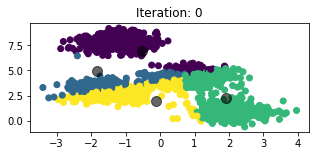

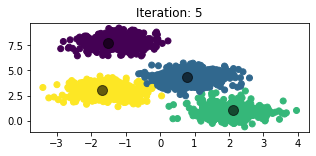

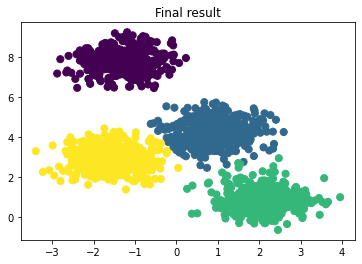

In [5]:
# Your code here

#Implement K-means from scratch
from sklearn.metrics import pairwise_distances_argmin

X, y_true = make_blobs(n_samples=1500, centers=4,
                       cluster_std=0.60, random_state=0)

def mini_batch_kmeans(X, n_clusters, replacement=True, 
                      batch_size=100, max_iter=100):
    n_samples, n_features = X.shape

    #1. randomly choose n clusters from X
    rng = np.random.RandomState(99)
    i = rng.permutation(X.shape[0])[:n_clusters]
    centers = X[i]

    #having max iter makes sure it will stop eventually
    for ix in np.arange(max_iter):
        random = rng.randint(X.shape[0])
        X_batch = X[random:random+batch_size]

        #2. assign lables based on closest center
        labels = pairwise_distances_argmin(X_batch, centers)

        #3. find new centers
        new_centers = []
        for i in range(n_clusters):
            new_centers.append(X_batch[labels == i].mean(axis=0))

        #convert list to np.array; you can actually combine #3
        #with np.array in one sentence 
        new_centers = np.array(new_centers)
        
        #plotting purpose
        #plot every 5th iteration to save space
        if (ix % 5 == 0):
            pred = pairwise_distances_argmin(X, new_centers)
            plt.figure(figsize=(5, 2))
            plt.title(f"Iteration: {ix}")
            plt.scatter(X[:, 0], X[:, 1], c=pred)
            plt.scatter(new_centers[:, 0], new_centers[:, 1], s=100, c="black", alpha=0.6)

        #4 stopping criteria - if centers do not 
        #change anymore, we stop!
        #make sure to add rtol or atol since mini-batch does not converge
        if(np.allclose(centers, new_centers, rtol=0.2)):
            break
        else:
            centers = new_centers
            
    print(f"Done in {ix} iterations")
    return centers
        
def predict(X, centers):
    return pairwise_distances_argmin(X, centers)

start = time()
preds = predict(X, mini_batch_kmeans(X, n_clusters=4))
print(f"Fit and predict time {time() - start}")
plt.figure()
plt.scatter(X[:, 0], X[:, 1], c=preds, s=50)
plt.title("Final result")

4. 

Implement spectral clustering with nearest neighbors kernel
Source: https://arxiv.org/pdf/0711.0189.pdf

Spectral clustering is a linear-algebra way of framing the clustering problems.  By making it a graph problem, we can define the best partition between subset of graphs based on minimizing graph cut.  Again, for those who would like to understand spectral embedding, recommend to read this paper: https://arxiv.org/pdf/0711.0189.pdf

The steps are simple (after all difficult derivation):

1. Create a **adjacency matrix (A)** graph.  You can use sklearn.neighbors.kneighbors_graph to create an adjacency matrix

For those who are unfamiliar with adjacency matrix, consider this matrix.  In reality, A, B, C, D do not exist, I just wrote for explaination purpose.

<code>  
     A B C D
A  [[0 1 1 0
B    1 0 1 0
C    1 1 0 0
D    0 0 0 0]]
</code>

Adjacency matrix is basically telling who are connected to who.  Here A is connected to B and C.  Since this is an undirected graph, thus B and C are also connected to A as depicted in their intersections.
    
2. Computer the **degree matrix(D)**

Degree matrix is simply the sum of all rows.  With the above example, it will be [2, 2, 2, 0]. Given it's a matrix, we will be putting these values in a diagonals like this:

<code>
[[2 0 0 0
  0 2 0 0
  0 0 2 0
  0 0 0 0]]
</code>
  
3. Compute the **Laplacian graph**

Laplacian is simply D - A which becomes

<code>
[[2 -1 -1 0
  -1 2 -1 0
  -1 -1 2 0
   0 0  0 0]]
</code>

4. This Laplacian graph has a nice (powerful) property, that is, its eigenvalues actually inform us the connection between nodes.  Bigger eigenvalues represent bigger connections.  Specifically, the first eigenvalues of L will be merely the connection of the whole graph which will always be 0 (because it's one connected component thus there are no connection), but then the second smallest eigenvalues (also known as Fielder value) will give you the optimal partition between two graphs.  It approximates the minimium graph cut needed to separate into two connected components.  It works because remember that eigenvalues = connectivity.  Thus the second smallest eigenvalue will tell us the minimum separation of two components, which is the best point to cut between two clusters!

5.  Last, we simply use the sign of the eigenvector to partition into either clusters.


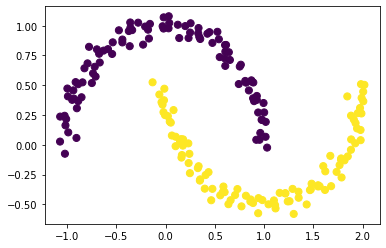

In [6]:
from sklearn.datasets import make_moons
X, y = make_moons(200, noise=.05, random_state=0)
plt.scatter(X[:, 0], X[:, 1], c=y,
            s=50, cmap='viridis');

First eigenvalues should be 0 accordingspectral clustering proof:  (1.0148132334464322e-16+0j)
First eigenvectors should be c across all row accordingspectral clustering proof:  [-0.07071068 -0.07071068 -0.07071068 -0.07071068 -0.07071068]


"\nYou may wonder how about situations with more than 2 clusters.  Since\neigenvectors contain information about the connection, we can simply\ninput the eigenvectors (let's say we want 4 clusters), thus we\ncan simply write:\n\nkmeans = KMeans(n_clusters = 4)\nkmeans.fit(eigenvectors[:, 1:4])\npreds = kmeans.labels_\n\nThat's it!\n"

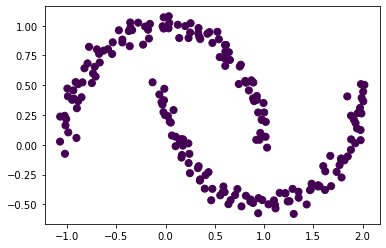

In [7]:
# Your code here

from sklearn.neighbors import kneighbors_graph
from sklearn.cluster import KMeans

X, y = make_moons(200, noise=.05, random_state=0)

#create an adjacency matrix
#this kneighbors_graph treats evvery data point as node
#and edge is drown to another node only if they are
#within the nth nearest neighbors (here I use 10)
A = kneighbors_graph(X, n_neighbors=10).toarray()

#create the degree matrix
#which is basically the sum of each row of A, and put it in the diagonal axis
D = np.diag(A.sum(axis=1))

#Laplacian graph is basically D - A
L = D - A

#find the eigenvalues and eigenvectors
eigenvalues, eigenvectors = np.linalg.eig(L)

#sort eigenvectors based on eigenvalues sort
#THIS IS DIFFERENT FROM PCA BECAUSE WE ARE SORTING SMALLEST TO BIGGEST
eigenvectors = eigenvectors[:, np.argsort(eigenvalues)]

#use eigenvector with second SMALLEST eigenvalues (also known as
#Fiedler value) to find best cut to separate data
#then use the sign of eigenvectors to determine the labels
#second smallest eigenvalues will tell us the minimum connection
#between two big component
preds = eigenvectors[:, 1] > 0

#Just for your information
print("First eigenvalues should be 0 according" + 
      "spectral clustering proof: ", eigenvalues[0])

#.real convert complex numbers to float
# c is any constant.  
# take first five for shortening the presentation
print("First eigenvectors should be c across all row according" + 
      "spectral clustering proof: ", eigenvectors[:, 0][:5].real)

plt.scatter(X[:, 0], X[:, 1], c=preds,
            s=50, cmap='viridis')

"""
You may wonder how about situations with more than 2 clusters.  Since
eigenvectors contain information about the connection, we can simply
input the eigenvectors (let's say we want 4 clusters), thus we
can simply write:

kmeans = KMeans(n_clusters = 4)
kmeans.fit(eigenvectors[:, 1:4])
preds = kmeans.labels_

That's it!
"""

5. Use the following data, fit Gaussian mixture model from scratch

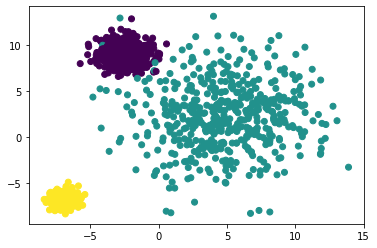

In [8]:
from sklearn import datasets
X, y = datasets.make_blobs(n_samples=1500,
                             cluster_std=[1.0, 3.5, 0.5],
                            random_state=42)
plt.scatter(X[:, 0], X[:, 1], c=y)

The concept is fairly simple.  Indeed, it is very similar to K-Means, i.e., instead of using the mean to determine which point belongs to which cluster, it uses the probability of a gaussian distribution to determine whether each sample $x_i$ should belong to which clusters.  For example, sample $x_i$ probabilty with first cluster is 0.1 and second cluster is 0.5, then we will assign $x_i$ to second cluster.  

Of course, similar to K-means, we also have to update the cluster gaussian distribution.  The formula will be given below.

That's it!

Detailed steps are as follows:

**Initialization:**
1. Define k number of clusters (c)
2. For each cluster, randomly initialize parameters mean $\mu_c$, covariance $\Sigma_c$, and fraction per class $\pi_c$ 

**E-step:** 
1. For each $x_i$, calculate the probability $r_{ic}$ (shape: $n * k$) that $x_i$ belongs to cluster c using this equation:

$$ r_{ic} = \frac{\pi_cN(x_i \mid \mu_c, \Sigma_{c})}{\Sigma_{k=1}^{K} \pi_kN(x_i \mid \mu_k, \Sigma_k)}$$

where $N(x_i \mid \mu_c, \Sigma_c)$ is the multivariate Gaussian distribution, computed using:

$$N(x_i \mid \mu_c, \Sigma_c)= \frac{1}{(2\pi)^\frac{n}{2}\lvert{\Sigma_c}\rvert^\frac{1}{2}}\exp(-\frac{1}{2}(x_i-\mu_c)^T\Sigma_{c}^{-1}(x_i - \mu_c))$$

$r_ic$ basically gives us $$ \frac{\text{Probability of x_i belonging to class c}}{\text{Probability of x_i over all classes}} $$

**M-step:**
1. For each cluster c, recompute the gaussian distribution - namely update the $\mu_c$, covariance $\Sigma_c$, and fraction per class $\pi_c$.

Fraction of points belongs to cluster c:

$$ m_c = \Sigma{_i}r_{ic} $$

Fraction per class:

$$ \pi_c = \frac{m_c}{m}$$

Mean of each cluster c:

$$ \mu_c = \frac{1}{m_c}\Sigma{_i}r_{ic}x_i$$

Covariance of each cluster:

$$ \Sigma{_c} = \frac{1}{m_c}\Sigma{_i}r_{ic}(x_i - \mu_c)(x_i - \mu_c)^T $$

Iteratively repeat the E and M step until the log likelihood function converges.  Can be computed as follows:

$$ ln p(X \mid \pi, \mu, \Sigma) = \Sigma_{i=1}^{N} ln(\Sigma_{k=1}^{K}\pi_kN(x_i\mid\mu_k,\Sigma_k)) $$

**Coding considerations**

1.  To ease our programming efforts, we can use <code>scipy.stats.multivariate_normal</code> for generating gaussian distribution, and using its <code>.pdf()</code> function to compute the values we want of $N(x_i \mid \mu_c, \Sigma_c)$ and use <code>logpdf()</code> to define stopping criteria

2. Shape of $R$ which keeps probability of $x_i$ belonging to kth cluster is $(n * k)$, where n is <code>X.shape[0]</code> and k is <code>n_clusters</code> we want.  This fact will be helpful when initializing

3. Shape of $\Sigma$ or covariance of each cluster is simply $(m * m)$ where m is n_features or X.shape[1]. If we define 3 clusters, then we will have [$\Sigma_1$, $\Sigma_2$, $\Sigma_3$], each with shape $(m * m)$, thus whole thing is shape $ (k * m * m) $

4. Shape of $\pi$ is simply $(k, )$
    
5. Shape of $\mu$ is similarly $(m, k)$, defining mean for each feature for kth cluster

6. What to initialize can be tricky.  For R and $\pi$, you can fill with 1/k.  As for $\mu$, it is easiest to simply pick random points from the samples as initial means.  Last, for covariance ($\Sigma$), we can simply use the covariance of the X as initialization (i.e., <code>np.cov(X.T)</code>)

LL difference:  38309.47619044143
LL difference:  1365.1527459032732
LL difference:  8039.313099496634
LL difference:  23155.131375182864
LL difference:  42498.932028504
LL difference:  76601.80392931531
LL difference:  146094.51003658253
LL difference:  297431.45078363986
LL difference:  7175.2741235719295
LL difference:  1178.9708615939599
LL difference:  324.44126101967413
LL difference:  105.18941731983796
LL difference:  36.574920702609234
LL difference:  13.035001577925868
LL difference:  4.684141889330931


Text(0.5, 1.0, 'Final')

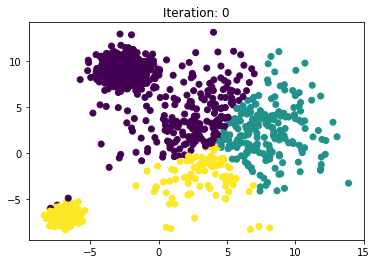

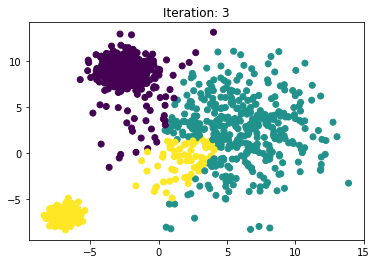

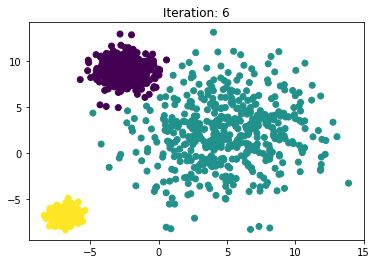

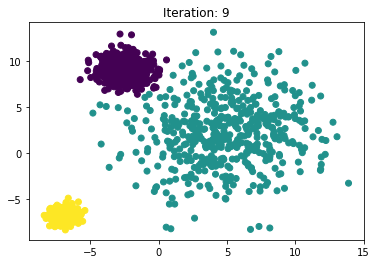

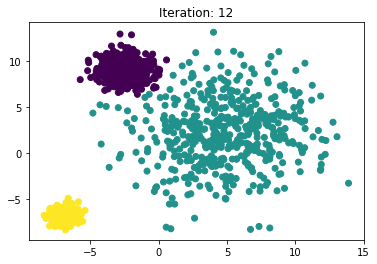

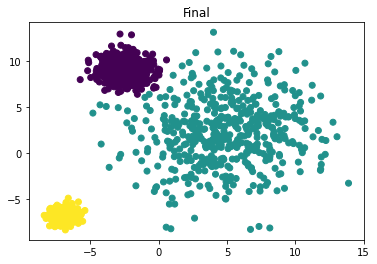

In [9]:
# Your code here

from sklearn.cluster import KMeans
from scipy.stats import multivariate_normal
import math

X, y = datasets.make_blobs(n_samples=1500,
                             cluster_std=[1.0, 3.5, 0.5],
                            random_state=42)
#define basic params
N, M = X.shape
K = 3
max_iter = 20

#old likelihood just for comparison
oldLL = 0

#define gaussian params
#all these params are in vectorized form
#meaning they contain values for all clusters
R = np.full(shape=(N, K), fill_value=1/K)

#simply use 1/k for pi
P = np.full((K, ), fill_value=1/K)

#simply use some rows as mean
random_row = np.random.randint(low=0, high=N, size=K)
MU = np.array([X[idx,:] for idx in random_row ]).T #.T to make to shape (M, K)

#simply use cov of the whole matrix as intialization
SIG = np.array([np.cov(X.T) for _ in range (K)])

for iteration in range(max_iter):
    
    #===E-Step=====
    #Update rc of each sample
    for i in range(N):
        for c in range(K):
            prob_of_xi = multivariate_normal.pdf(X[i], mean=MU[:, c], cov=SIG[c])
            R[i, c] = P[c] * prob_of_xi
        R[i] /= np.sum(R[i])
    
    #calculate log likelihood
    #check for convergence
    #you can delete this part of code, but
    #checking difference in log likelihood is a 
    #good stopping criteria
    LL = 0
    for i in range(N):
        for c in range(K):
            LL += math.log(P[c])
            LL += multivariate_normal.logpdf(
                X[i], mean=MU[:, c], cov=SIG[c])
    
    #if there is less than 0 increase in performance
    #in terms of log likelihood, we stop
    print("LL difference: ", math.fabs(LL - oldLL))
    if(math.fabs(LL-oldLL) < 5):
        break
    oldLL = LL
    
    #every three plot once
    if(iteration % 3 == 0):
        preds = np.argmax(R, axis=1)
        plt.figure()
        plt.scatter(X[:, 0], X[:, 1], c=preds)
        plt.title(f"Iteration: {iteration}")
    
    #===M-Step====
    #mc = sum of all rc
    #MC is vectorized form of all mc
    #Axis = 0 -> sum across all samples
    MC = np.sum(R, axis=0)
    assert MC.shape == (K, )
    
    #P is vectorized form of all pi
    P = MC / N
    assert P.shape == (K, )
    
    #mean
    #each mean is xi * ri / mc
    #MU is vectorized form of all mean
    MU =  ( X.T @ R ) / MC
    assert MU.shape == (M, K)
    
    #covariance (also called Sigma)
    #SIG is vectorized form of all covariances 
    for c in range(K):
        for i in range(N):
            Xmu = (X[i]-MU[:, c]).reshape(-1, 1)
            SIG[c] += R[i, c] * (Xmu @ Xmu.T)
        SIG[c] /= MC[c]
    assert SIG.shape == (K, M, M)
        

#get preds
preds = np.argmax(R, axis=1)

#plot
plt.figure()
plt.scatter(X[:, 0], X[:, 1], c=preds)
plt.title("Final")